<a href="https://colab.research.google.com/github/Gagandataexplorer/Gagandataexplorer/blob/main/Midterm_Project_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center>
<h2>Image Classification and Convolution of MRI Brain Scans</h2>
<b><h3>Mid-Term Project: Math 232</h3></b>
By 
<br>
<I><h4>Gagandeep Kaur and Joshua Bojorquez<h4></I>
</center>



In [ ]:
from IPython.display import Image
Image(url='https://media.giphy.com/media/PjJ1cLHqLEveXysGDB/giphy.gif?cid=ecf05e477oz2v0wsh228viy6l2uqu74cf2yovjcdf9q80lyl&rid=giphy.gif&ct=g') 

## **Index**

* [Introduction](#intro)
* [Data Description](#data)
* [Methodology](#method)
* [Code Implementation](#code)
    * [Image Classification](#img)
    * [Edge detection](#edge)
    * [ SVD](#svd)
* [Results](#res)
* [Conclusion](#con)
* [References](#ref)


###**Introduction:**<a id='intro'></a>
Cancer of the brain is a serious affliction that is not always easy to diagnose.  In fact, the most commonly used method of diagnosis by medical practitioners is to simply look at a brain scan through Magnetic Resonance Imaging (MRI).  While this is still a more advanced way of diagnosing brian tumors, MRI scans typically do not differentiate between types of tumors, the severity of the tumor, and a few other critical indicators of cancer being present.  (Berger et. al) Due to this, it can often be problematic for doctors to determine if a patient may have a brain tumor.  There is a need for a way to digitally process, classify, and analyze this data to minimize the risks that go into human error.  We can use image processing techniques and convolution of MRI brain scans to get a more accurate diagnosis of looking for brain tumors.  The focus will be on identifying glioma tumors, a type of brain tumor that occurs in the brain and spinal cord and it is one of the most common types of brain tumors.     


### **Data Description**<a id = "data"></a>

The data which we will be using comes from Kaggle and can be found at the following link: [Click Here to see the data](https://www.kaggle.com/datasets/sartajbhuvaji/brain-tumor-classification-mri). These images consist of MRI brain scans of subjects with and without glioma tumors.


###**Methodology**<a id = 'method'></a>

<h3>Image Classification:</h3>
The first step is to have all the images of the brains with and without glioma tumors loaded from a directory.  This will be the “Image Classification” component of the research.  Once these images are loaded into the directory, we can use them to create training, testing, and validation data. Image Classifcation using Keras are used as a method for the image classification [2].  This model will allow us to use test data to predict if the image contains a tumor or not. 
 
We can then categorize the images in order to use our training images of glioma, and images of brains with no tumors, and test our results against images to see if our model is accurate.  

<h3>Edge detection:</h3>
Convolution acts as a way to filter out some of the data that would hinder the ability for an image to be accurately represented, also called “noise”.  In order to do this, we use a method called convolution provided by the function: 
This sets up the images to be filtered by altering the pixels of the image by looking at the intensity of the surrounding pixels.  
Here, in our edge detection of the picture, we will just use one picture of the MRI. We will be using the Sober's Kernes [1] given as
<br>
\begin{bmatrix}
-1 & 2 & -1\\
0 & 0 & 0\\
1 & 2 & 1
\end{bmatrix}
This matrix gives us the horizontal filter to apply on the picture/image. Simialrly, the vertical filter is given by
<br>
\begin{bmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{bmatrix}
This will be applied on the one image of the MRI to examine the exact edge of tumor or location.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


###**Code Implementation**<a id = 'code'></a>
In this section, we are doing the code implementation of the above mentioned methods.

In [ ]:
# Import necessary packages
from IPython.display import HTML, Image
import numpy as np
from scipy import linalg as la
from scipy import sparse
import pandas as pd
import matplotlib.image as img
import os
import cv2
# import plotting packages
import matplotlib.pyplot as plt # for plots
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd
from PIL import Image, ImageOps
from scipy.sparse import diags

# Packages for Image Classification
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from datetime import datetime
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Flatten,Activation,Dense,Dropout,Conv2D,MaxPool2D
import tensorflow.keras.layers as tfl

In [ ]:
# Connecting with the google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### <center> <b> Data for Glioma Tumors </b> </center>
Here, we are just accessign the data and plotting some pictures to see how they look.



In [ ]:
# accessing all the images of glioma tumor

# Accessing a directory from google drive containing Glioma tumor
train_dir = '/content/drive/Shareddrives/Math 232 Group Project/Brain_tumor/glioma_tumor_TRAIN'
train_imgs = ['../input/train_images/{}'.format(i) for i in os.listdir(train_dir)]

pictures_photos=os.listdir(train_dir)[0:100] # Accessing the first 100 pictures of glioma tumors for training
pictures_images=[train_dir+'/' + photo for photo in pictures_photos]

# reading all the pictures from 1-100
s = [img.imread(imge) for imge in pictures_images] # storing all the pictures in a list

new_img = [img.reshape(img.shape[0], (img.shape[1]*img.shape[2])) for img in s] #Changing the dimension from 3-D to 2-D

t = [np.asmatrix(img, dtype=None) for img in new_img] #changing the nd array to matrix


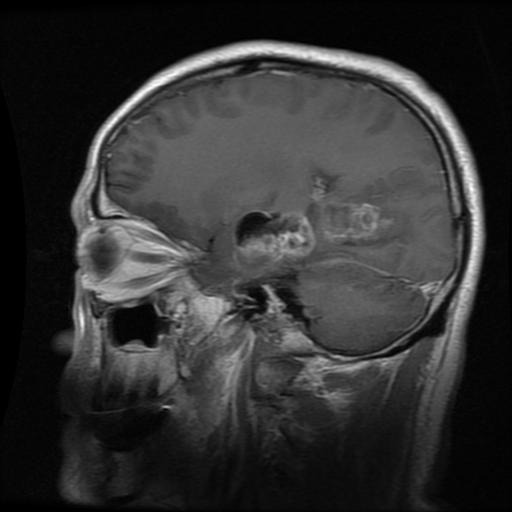

In [ ]:
# plotting the first picture of tumor data
img1 = s[0]
fig = px.imshow(img1, color_continuous_scale='gray', title="MRI of brain with tumor")
fig.update_layout(coloraxis_showscale=False)
fig.update_xaxes(showticklabels=False)
fig.update_yaxes(showticklabels=False)
fig.show()

<center>
<h2><b>Data for No Tumors</b></h2>
</center>

In [ ]:
# accessing all the images of glioma tumor

# Accessing a directory from google drive of MRI scans containing no tumors
train_dir_1 = '/content/drive/Shareddrives/Math 232 Group Project/Brain_tumor/no_tumor_TRAIN'
train_imgs_1 = ['../input/train_images/{}'.format(i) for i in os.listdir(train_dir_1)]

pictures_photos_1=os.listdir(train_dir_1)[0:100]# Accessing the first 100 pictures of no tumors for training
pictures_images_1=[train_dir_1+'/' + photo for photo in pictures_photos_1]

# reading all the pictures from 1-100
s_1 = [img.imread(imge) for imge in pictures_images_1]

new_img_1 = [img.reshape(img.shape[0], (img.shape[1]*img.shape[2])) for img in s_1] #Changing the dimension from 3-D to 2-D

t_1 = [np.asmatrix(img, dtype=None) for img in new_img_1] #changing the nd array to matrix

images_1 =np.array(new_img_1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.




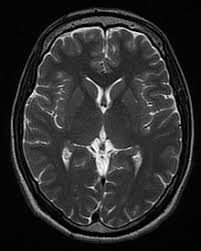

In [ ]:
img = s_1[0] # for the first picture
fig = px.imshow(img, color_continuous_scale='gray', title="MRI of brain with no tumor")
fig.update_layout(coloraxis_showscale=False)
fig.update_xaxes(showticklabels=False)
fig.update_yaxes(showticklabels=False)
fig.show()

<center><h2><b> Image Classification</b></h2></center>
In this section, we will process teh data for the image classifcation using the method mentioned above. Here, we will be able to see the predictions of images or labels using the specified model.

In [ ]:
!mkdir math232Training # craeting a directory for the training, testing data

mkdir: cannot create directory ‘math232Training’: File exists


In [ ]:
# ImageDataGenerator that rescales the image, 
# applies shear in some range, zooms the image and does horizontal flipping with the image. 
# This ImageDataGenerator includes all possible orientation of the image.
imgd=ImageDataGenerator(rescale=1/255)

# accessing the training data from the directory 
tumor_dataset=imgd.flow_from_directory('math232Training/Training')

# checking for the indices
tumor_dataset.class_indices

Found 1221 images belonging to 2 classes.


{'glioma_tumor': 0, 'no_tumor': 1}

In [ ]:
# checking for the number of images in each index/class
classes=pd.DataFrame(tumor_dataset.classes)
classes.value_counts()

0    826
1    395
dtype: int64

In [ ]:
# writing the path to the training data
path_train = 'math232Training/Training'

# writing the path to the testing data
path_test = 'math232Training/Testing'

train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255,validation_split=0.2)

# Train_datagen.flow_from_directory is the function that is 
# used to prepare data from the train_dataset directory Target_size specifies the target size of the image.
train_data = train_datagen.flow_from_directory(
        path_train,
        subset='training',
        target_size=(200 , 200),
        batch_size=32)

# validation_data is used to feed the validation/test data into the model. 
val_data = train_datagen.flow_from_directory(
        path_train,
        subset='validation',
        target_size=(200 , 200),
        batch_size=32 )

# test_datagen.flow_from_directory is used to prepare test data for the model and all is similar as above.
test_data = train_datagen.flow_from_directory(
        path_test,
        target_size=(200 , 200),
        batch_size=32 )

Found 977 images belonging to 2 classes.
Found 244 images belonging to 2 classes.
Found 205 images belonging to 2 classes.


In [ ]:
model =Sequential()

#convolution and maxpoollayer
# Conv2D is the layer to convolve the image into multiple images 
model.add(Conv2D(filters=25,kernel_size=3,
                 strides=2,padding='valid',input_shape=(200,200,3)))
model.add(Activation('relu')) #Activation is the activation function. 
model.add(MaxPool2D(pool_size=2)) 
# MaxPooling2D is used to max pool the value from the given size matrix and same is used for the next 2 layers. 
# then, Flatten is used to flatten the dimensions of the image obtained after convolving it. 

#flatten layer
model.add(Flatten())

#hidden layer
model.add(Dense(4)) #Dense is used to make this a fully connected model and is the hidden layer. 
model.add(Activation('relu'))

#output layer
model.add(Dense(2))
model.add(Activation('sigmoid'))


model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 99, 99, 25)        700       
                                                                 
 activation_3 (Activation)   (None, 99, 99, 25)        0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 49, 49, 25)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 60025)             0         
                                                                 
 dense_2 (Dense)             (None, 4)                 240104    
                                                                 
 activation_4 (Activation)   (None, 4)                 0         
                                                      

In [ ]:
# Compile function is used here that involve the use of loss, 
# optimizers and metrics. Here loss function used is binary_crossentropy, optimizer used is rmsprop.
model.compile(loss='binary_crossentropy',optimizer='rmsprop',metrics=['accuracy'])

# epochs tells us the number of times model will be trained in forward and backward pass.
history=model.fit (train_data, epochs=4, validation_data=val_data)

Epoch 1/4
31/31 [==============================] - 10s 314ms/step - loss: 0.5731 - accuracy: 0.6694 - val_loss: 0.6068 - val_accuracy: 0.6762
Epoch 2/4
31/31 [==============================] - 10s 305ms/step - loss: 0.4251 - accuracy: 0.8444 - val_loss: 0.5099 - val_accuracy: 0.7746
Epoch 3/4
31/31 [==============================] - 10s 304ms/step - loss: 0.3442 - accuracy: 0.9110 - val_loss: 0.4507 - val_accuracy: 0.8156
Epoch 4/4
31/31 [==============================] - 10s 310ms/step - loss: 0.2947 - accuracy: 0.9417 - val_loss: 0.4147 - val_accuracy: 0.8607


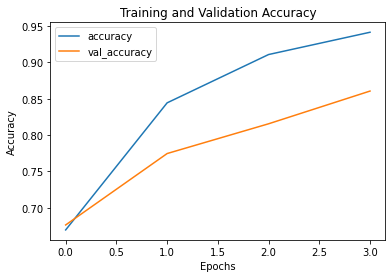

In [ ]:
plt.plot(history.history['accuracy'],label='accuracy')
plt.plot(history.history['val_accuracy'],label='val_accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy');

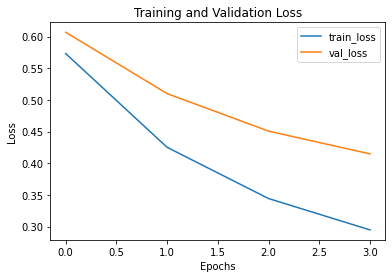

In [ ]:
# plotting the loss Vs epochs
plt.plot(history.history['loss'],label='train_loss')
plt.plot(history.history['val_loss'],label='val_loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss');

In [ ]:
# predicting the class of MRI using the test_dataset
y_predicted=model.predict(test_data)
tumor_classes=['glioma_tumor','no_tumor']
for i in range (len(y_predicted)):
    predicted_tumor=tumor_classes[np.argmax(y_predicted[i])]
    print(predicted_tumor)

7/7 [==============================] - 1s 162ms/step
no_tumor
no_tumor
no_tumor
glioma_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
glioma_tumor
no_tumor
no_tumor
no_tumor
glioma_tumor
no_tumor
glioma_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
glioma_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
glioma_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
glioma_tumor
no_tumor
no_tumor
no_tumor
no_tumor
glioma_tumor
no_tumor
glioma_tumor
no_tumor
no_tumor
no_tumor
glioma_tumor
no_tumor
no_tumor
glioma_tumor
glioma_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
glioma_tumor
no_tumor
glioma_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
glioma_tumor
glioma_tumor
no_tumor
no_tumor
glioma_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no_tumor
glioma_tumor
no_tumor
no_tumor
no_tumor
no_tumor
no

## Edge Detection


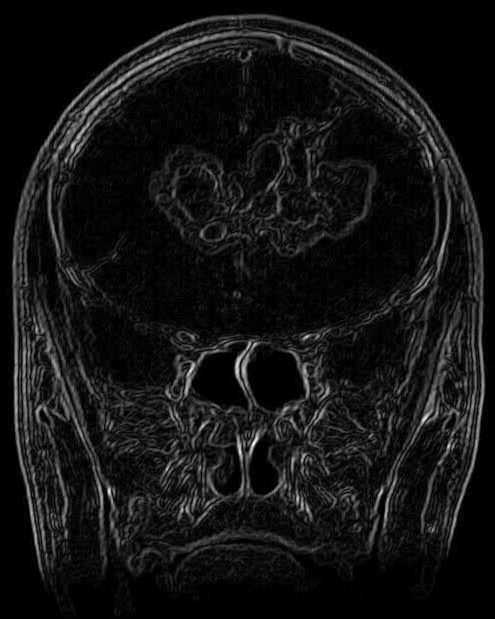

In [ ]:
#define the vertical filter
vertical_filter = [[0,-1,1], [-2,0,2], [-1,0,1]]

#define the horizontal filter
horizontal_filter = [[-1,0,-1], [0,0,0], [-1,2,1]]


#read in the pinwheel image
img = plt.imread('/content/drive/Shareddrives/Math 232 Group Project/Brain_tumor/glioma_tumor_TEST/image(1).jpg')

#get the dimensions of the image
n,m,d = img.shape

#initialize the edges image
edges_img = img.copy()


#loop over all pixels in the image
for row in range(3, n-2):
    for col in range(3, m-2):
        
        #create little local 3x3 box
        local_pixels = img[row-1:row+2, col-1:col+2, 0]
        
        #apply the vertical filter
        vertical_transformed_pixels = vertical_filter*local_pixels
        #remap the vertical score
        vertical_score = vertical_transformed_pixels.sum()/4
        
        #apply the horizontal filter
        horizontal_transformed_pixels = horizontal_filter*local_pixels
        #remap the horizontal score
        horizontal_score = horizontal_transformed_pixels.sum()/4
        
        #combine the horizontal and vertical scores into a total edge score
        edge_score = (vertical_score**2 + horizontal_score**2)**.5
        
        #insert this edge score into the edges image
        edges_img[row, col] = [edge_score]*3

#remap the values in the 0-1 range in case they went out of bounds
edges_img = edges_img/edges_img.max()

import plotly.express as px
px.imshow(edges_img, color_continuous_scale='gray', title = "Edge detected picture after applying the horizontal and vertical shifts")

<center><h2><b>SVD for data with tumor</h2></b></center>
This section is extra. We did try to do something using SVD(like dimension reduction adn see the changes) This is kind of extra work. not a part of the topics we chose.

In [ ]:
# factor image with SVD
rank = 50
U_rank3 = []
s_rank3 = []
Vt_rank3 = []
temp = []
for i in range(0,100):
  U, s, Vt = la.svd(t[i], full_matrices=True)
  #print(U.shape, s.shape, Vt.shape)
  U_rank3.append(np.matrix(U[:,0:rank]))
  s_rank3.append(np.diag(s[0:rank]))
  Vt_rank3.append(np.matrix(Vt[0:rank,:]))
  #print(U_rank3.shape, s_rank3.shape, Vt_rank3.shape)
  temp.append(U_rank3[i] * s_rank3[i] * Vt_rank3[i])

In [ ]:
# First picture after reducing the rank.
px.imshow(temp[1], color_continuous_scale='gray')


In [ ]:
# Calculating the second norm using the SVD
norm_tumor = []
for i in range(0,100):
  norm_tumor.append(la.norm(t[i]-temp[i],2))


In [ ]:
rank = np.linspace(0,100,20)
fig = go.Figure()
fig.add_trace(go.Scatter(x=rank,y=norm_tumor,name = "Gliomr tumor"))
# Edit the layout (change title, x-axis title, y-axis title)
fig.update_layout(title='Rank Vs 2nd norm',
                  xaxis_title='rank',
                 yaxis_title='Norm')

In [ ]:
# plotting the Rank VS singular values

fig1 = go.Figure()
fig1.add_trace(go.Scatter(x=rank,y=s[0:100],name="Gliomr tumor"))
# Edit the layout (change title, x-axis title, y-axis title)
fig1.update_layout(title='Rank Vs Singular values',
                  xaxis_title='rank',
                 yaxis_title='Singular values')

<center><h3><b>SVD for no tumor</b></h3></center>

In [ ]:
# factor image with SVD
rank = 50
Un_rank3 = []
sn_rank3 = []
Vnt_rank3 = []
tempn = []
for i in range(0,100):
  Un, sn, Vnt = la.svd(t_1[i], full_matrices=True)
  #print(U.shape, s.shape, Vt.shape)
  Un_rank3.append(np.matrix(Un[:,0:rank]))
  sn_rank3.append(np.diag(sn[0:rank]))
  Vnt_rank3.append(np.matrix(Vnt[0:rank,:]))
  #print(U_rank3.shape, s_rank3.shape, Vt_rank3.shape)
  tempn.append(Un_rank3[i] * sn_rank3[i] * Vnt_rank3[i])

In [ ]:
# Calculating the norm using the SVD
normn_tumor_1 = []
for i in range(0,100):
  normn_tumor_1.append(la.norm(t_1[i]-tempn[i],2))

In [ ]:
rank = np.linspace(0,100,20)
fig.add_trace(go.Scatter(x=rank,y=normn_tumor_1,name ="No tumor"))

In [ ]:
# comparing the ranks Vs singualr values of both the data with and without tumor
fig1.add_trace(go.Scatter(x=rank,y=sn[0:100],name="No tumor"))

###**Results:**<a id = 'red'></a> 

*  Image Classification: In the visualizations we see that the model was able to predict the data 95% accurately using the training ansd testing data and 86% accuracy obtained after cross-checking using the Validation dataset.
*  Edge detection: using the edge detection, we see that the edge or image can be sharpen using the vertical and horizontal filters. The picture genreated was really clear to see the location of the tumor or abnormality.

### **Conclusion:**<a id = 'con'></a>
This model could be used in conjunction with new evolving methods, such as algorithms and more elaborate image processing.  There should still be solace in knowing that there is a fairly high rate of using image classification and edge detection as a way to analyze brain MRI.  Using technology and coding in this way could only benefit patients even more and assist medical professionals in properly diagnosing those who are affected.
<br>
That is after Image classifcation, edge detection can be used to properly examine the images which has tumor and see the compelxities and the proper treatement. Also, edge detection can tell you more about teh best pixels, we need to evaluate the pictures and we can again use it for image classification to improve the accuracy of the model.

###**References:**<a id = 'ref'></a>



[1]  https://www.kaggle.com/datasets/sartajbhuvaji/brain-tumor-classification-mri 

[2] http://www.sci.utah.edu/~acoste/uou/Image/project2/ArthurCOSTE_Project2.pdf

[3] https://www.geeksforgeeks.org/python-image-classification-using-keras/

[4] Berger, Mitchel., Mitchel S. Berger, and Michael Weller. Gliomas. Ed. Mitchel S. Berger and Michael Weller. Amsterdam: Elsevier, 2016. Print.


<h2><b>Extra Credit:</b></h2> Please find the links to the google slides for extra credit:

Gagandeep Kaur: https://sites.google.com/mail.fresnostate.edu/gagandeepkaur/home

Joshua Bojorquez: https://sites.google.com/mail.fresnostate.edu/jbojorquez/home